<a href="https://colab.research.google.com/github/kocurvik/edu/blob/master/PSO/notebooks/PSO_cv11_en.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab 11 - Image transformations

In this lab we will perform various types of image transformation, including, resizing, rotation, affine and perspective trasnformations.

## Pixel positions and interpolation

An important aspect of transformations is interpolation. Since the pixel values are laid out in a grid we should understand where the actual intensity value is considered to be present.

<div>
<img src="https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/transforms_centers.svg" width="300"/>
</div>

We assume that the pixel intensities are defined for the pixel centers.

If we intend to resize images we have to find the values at new locations for pixel centers.

For example when resizing an image we can enlarge it:
<div>
<img src="https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/transforms_resize_upsample.svg" width="300"/>
</div>

Or we can make it smaller:
<div>
<img src="https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/transforms_resize_downsample.svg" width="300"/>
</div>


Note that the new positions may not lie on existing grid points. Even if they did we may lose important information if we only used pixels for the captured positions. We therefore have to perform interpolation to obtain the values. We can use different types of interpolation.

<div>
<img src="https://upload.wikimedia.org/wikipedia/commons/9/90/Comparison_of_1D_and_2D_interpolation.svg" width="600"/>
</div>

Last image by [Cmglee](https://commons.wikimedia.org/wiki/User:Cmglee) licensed under [CC BY-SA 4.0 DEED](https://creativecommons.org/licenses/by-sa/4.0/deed.en).








### Exercise 1 - Resizing

Try to resize images by first resizing them to smaller size and then back to a larger size. Try different interpolation methods in `cv2.resize()`.

Use the provided `cshow` function to display images at native resolution.


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

!wget https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/vertical_fence.png
!wget https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/building.jpg
!wget https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/shell.jpg

--2023-12-04 23:09:31--  https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/vertical_fence.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1224921 (1.2M) [image/png]
Saving to: ‘vertical_fence.png.4’

vertical_fence.png. 100%[===================>]   1.17M  --.-KB/s    in 0.06s   

2023-12-04 23:09:32 (18.3 MB/s) - ‘vertical_fence.png.4’ saved [1224921/1224921]

--2023-12-04 23:09:32--  https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/building.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 572

In [ ]:
import matplotlib
dpi = matplotlib.rcParams['figure.dpi']

def cshow(img, title=None):
  height, width, depth = img.shape
  figsize = width / float(dpi), height / float(dpi)
  plt.figure(figsize=figsize)
  plt.imshow(img[:, :, ::-1])
  plt.axis('off')
  plt.title(title)
  plt.show()

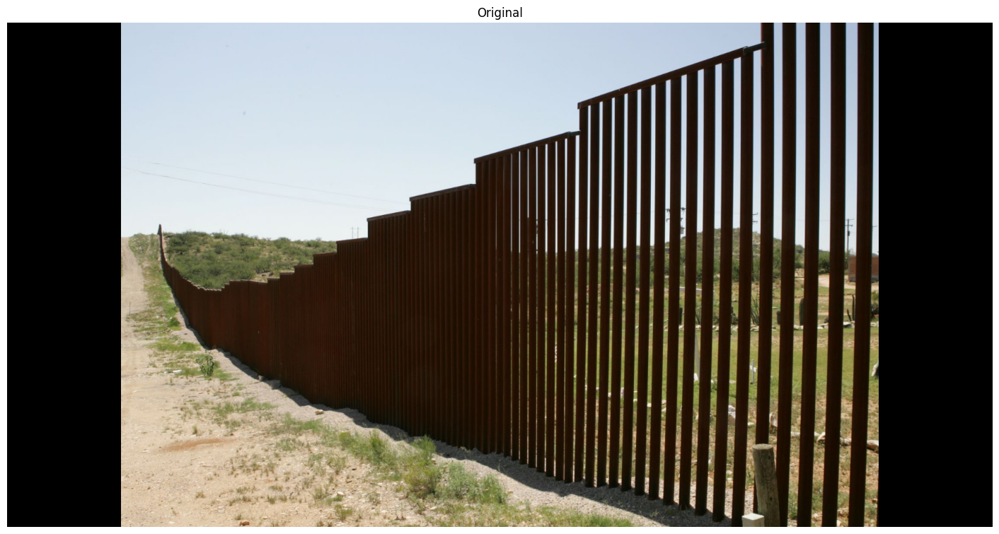

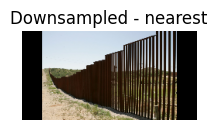

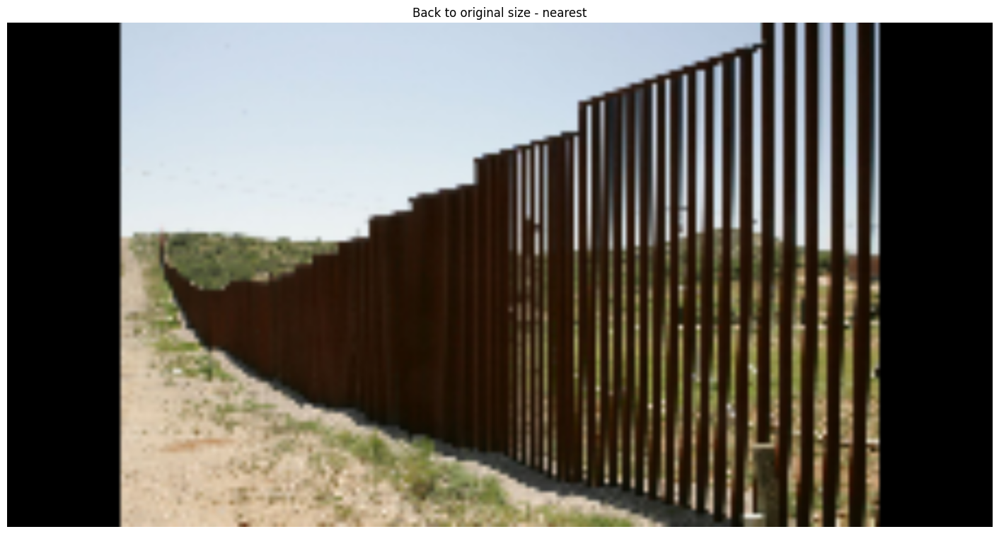

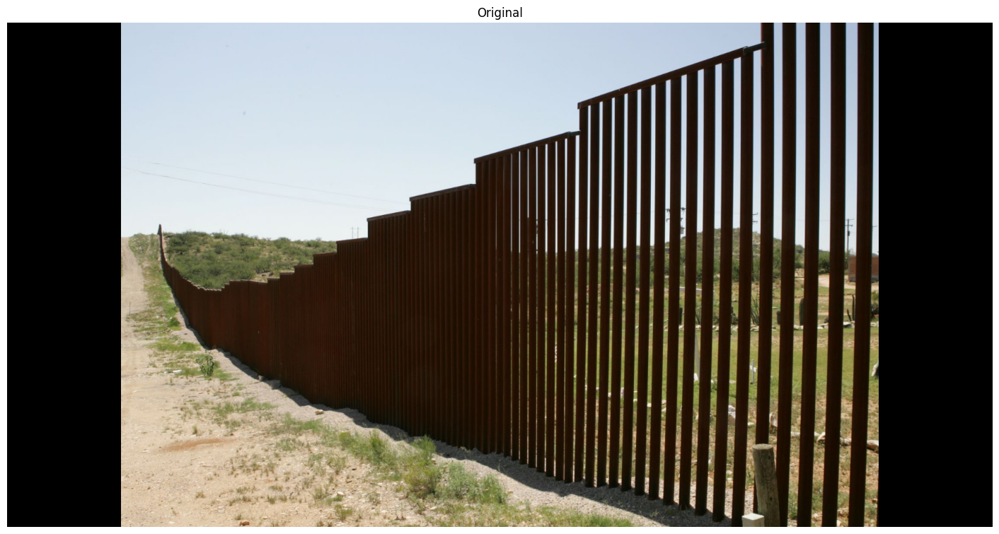

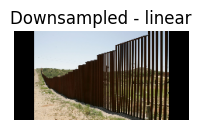

...

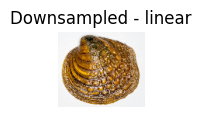

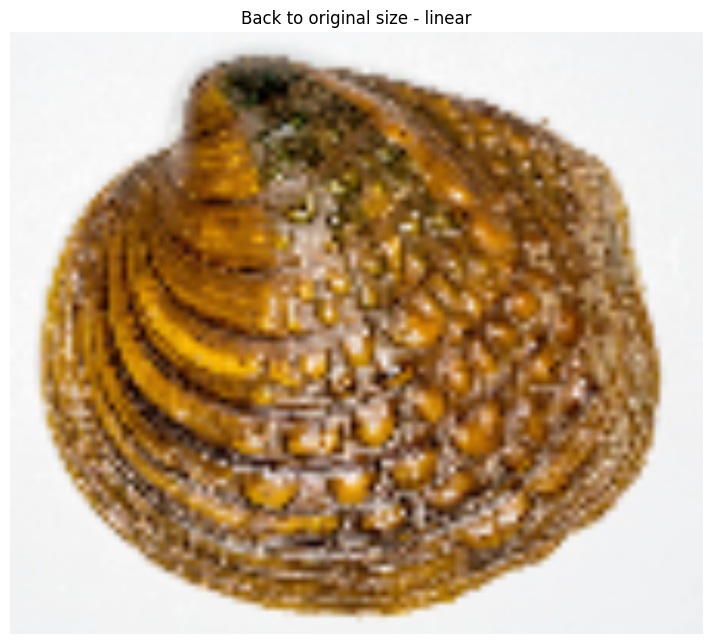

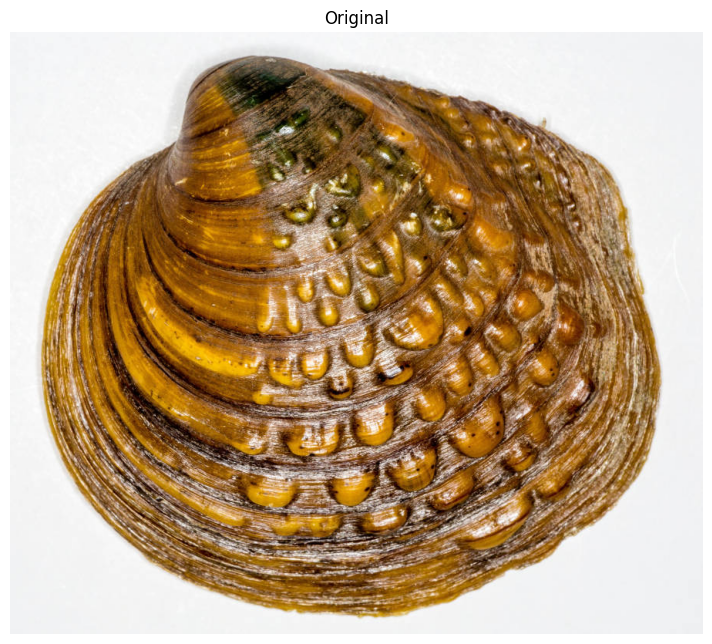

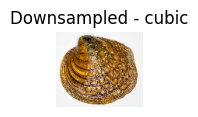

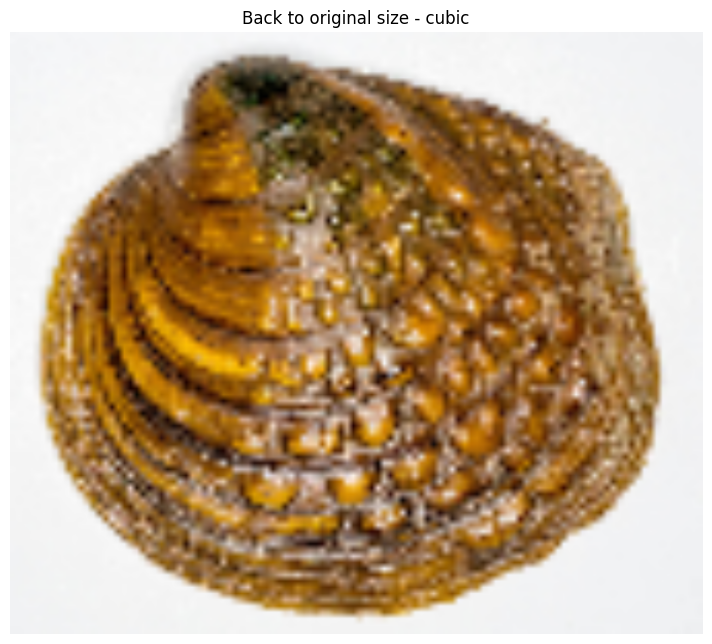

In [ ]:
...

## Affine Transformation

The transform is given by the following equation where $\vec{y}$ is the new position of the pixel.

$$ \vec{y} = \mathbb{A}\vec{x} + \vec{t},$$

where $\mathbb{A} \in \mathbb{R}^{2\times2}$ and $\vec{t} \in \mathbb{R}^2.$

When considering images we do not calculate $\vec{y}$ based on pixel positions $\vec{x}$, but instead we first choose some regular grid of $\vec{y}$ vectors and then calculate their respective position in the image using the inverse transform $\vec{x} = \mathbb{A}^{-1} (\vec{y} -\vec{t})$. This allows us to use interpolation in a straightforward fashion.

To perform rotation we can set:
$$ \mathbb{A} = \begin{bmatrix}
    cos(\alpha)       & -sin(\alpha)  \\
    sin(\alpha)       & cos(\alpha)  \\   
\end{bmatrix}$$

We can also do other transformations such as scaling rescaling the x-axis:
$$ \mathbb{A} = \begin{bmatrix}
    2       & 0  \\
    0       & 1  \\   
\end{bmatrix}$$

The affine transformation can usually be also expressed in terms of a single matrix:

$$M = \left[A | \vec{t} \right]$$


If we use the previous visualizations we can see how rotation affects the positions:

<div>
<img src="https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/transforms_rotate.svg" width="300"/>
</div>

Or we can see a general affine transformation:

<div>
<img src="https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/transforms_affine.svg" width="300"/>
</div>

### Exercise 2 - Flipping axes

Flip an image horizontally and vertically using affine transformation. Use OpenCV `cv2.warpAffine`.

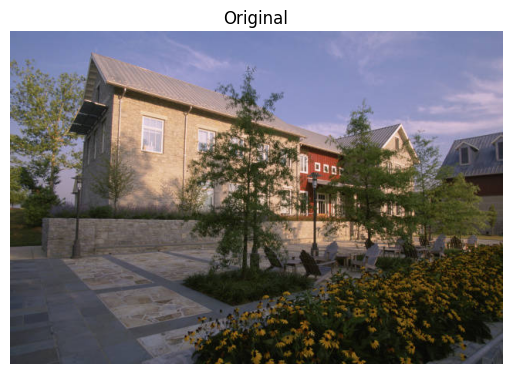

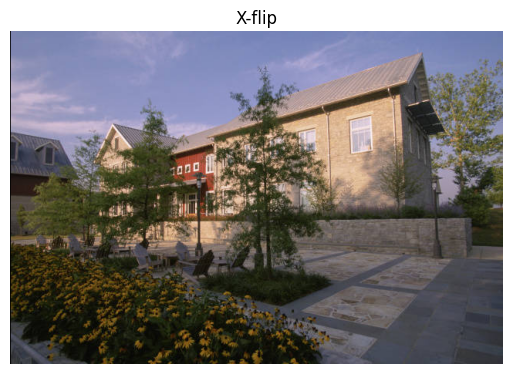

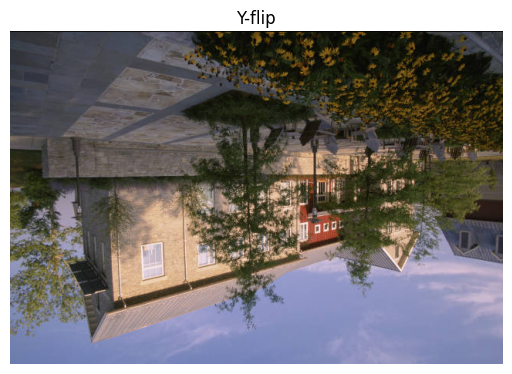

In [ ]:
...

### Exercise 3 - Image rotation

Implement a function `img_rotate(img, deg)` which rotates an image `img` by `deg` degrees using an affine transformation. Use `cv2.warpAffine`. To obtain the affine transformation matrix you can use `cv2.getRotationMatrix2D` or implement it yourself.


In [ ]:
def img_rotate(img, deg):
  ...

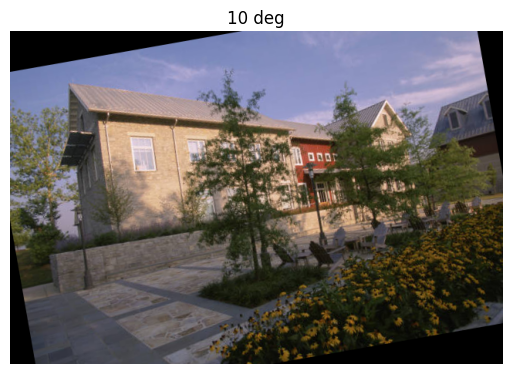

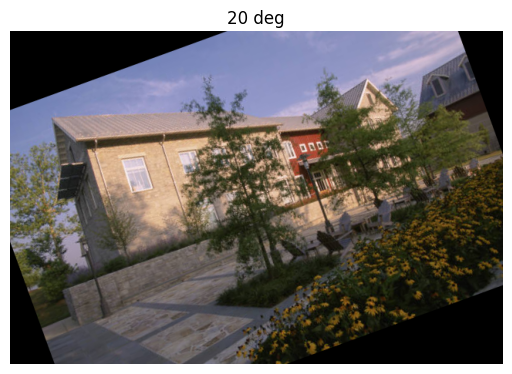

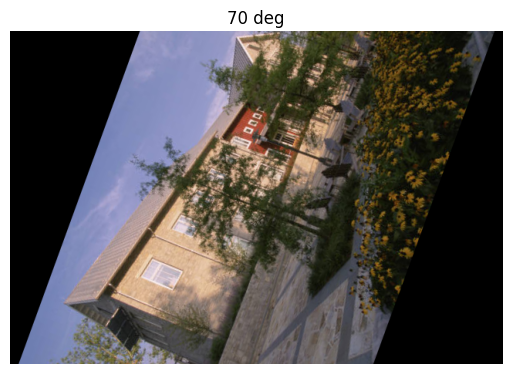

In [ ]:
img = cv2.imread('building.jpg')

cshow(img_rotate(img, 10), "10 deg")
cshow(img_rotate(img, 20), "20 deg")
cshow(img_rotate(img, 70), "70 deg")

## Perspective tranformation (Homography)

Perspective transformation allows us to project an image from one plane in 3D space to another one. We can use this to rectify planar surfaces.

The perspective transformation is performed in the following way:

$$ w \begin{pmatrix} \hat{x} \\ \hat{y} \\ 1 \end{pmatrix} = M \begin{pmatrix} x \\ y \\ 1 \end{pmatrix},$$

where $M \in \mathbb{R}^{3 \times 3}$. We include the term $w$ because we are using homogenous coordinates. When $M$ is regular the transformation is also called a homography.

We can obtain the matrix $M$ in other ways, but a common practice is to use 4 corresponding points. For examples if you take four corners of a book and map them to image corner coordinates you can get a rectified image.

### Exercise 4 - Rectification

The code below shows an image along with the corner points of a sign. Use these corner points to obtain an image of the rectified sign. Use `cv2.warpPerspective` in combination with `cv2.getPerspectiveTransform`.


--2023-12-04 23:09:58--  https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/sign.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 76828 (75K) [image/jpeg]
Saving to: ‘sign.jpg.2’

sign.jpg.2          100%[===================>]  75.03K  --.-KB/s    in 0.02s   

2023-12-04 23:09:58 (3.40 MB/s) - ‘sign.jpg.2’ saved [76828/76828]



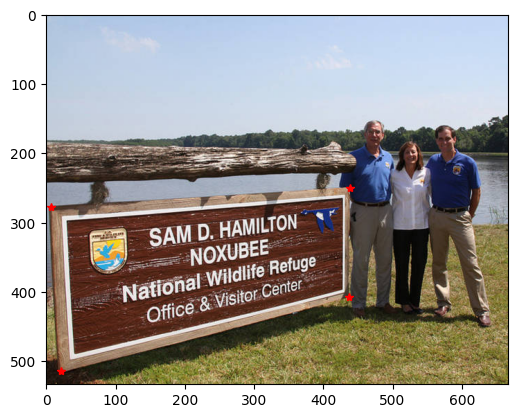

In [ ]:
!wget https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/sign.jpg

img = cv2.imread('sign.jpg')
pts = np.array([[6, 278], [438, 250], [437, 408], [21, 514]])

plt.imshow(img[:, :, ::-1])
plt.plot(pts[:, 0], pts[:, 1], 'r*')
plt.show()

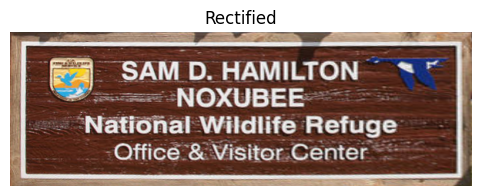

In [ ]:
...